In [1]:
import os
import sys
import warnings

In [2]:
import pandas as pd
import scanpy as sc
from spatialdata import read_zarr

/dss/dsshome1/0C/ra98gaq/miniconda3/envs/sdata/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


In [3]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context

plt.rcParams["font.family"] = (
    "Arial" if "Arial" in [f.name for f in fm.fontManager.ttflist] else "sans-serif"
)
plt.rcParams["font.weight"] = "normal"
# see https://medium.com/@daimin0514/how-to-install-the-arial-font-in-linux-9e6ac76d3d9f
import seaborn as sns

In [4]:
sys.path.insert(1, "/home/src")

In [5]:
# sys.path.insert(1, join(Path(__file__).parent.parent.resolve(), "src"))
import importlib

import cell_annotation_utils as anno_utils

importlib.reload(anno_utils)

<module 'cell_annotation_utils' from '/home/src/cell_annotation_utils.py'>

In [6]:
from datetime import date

today = date.today().strftime("%Y%m%d")
today

'20250430'

In [7]:
warnings.filterwarnings("ignore")

In [8]:
# data_dir = os.path.abspath("../../data")
data_dir = os.path.abspath("/home/data")
!ls -l $data_dir

lrwxrwxrwx 1 ra98gaq pn52ra 53 Mar 12 17:01 /home/data -> /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark


In [9]:
sample_name = "foxf2_s2_r1"
method_name = "Baysor_2D_nucleus_100"
method_name = "Cellpose_1_nuclei_model"
method_name = "Baysor_3D"
method_name = "Proseg_Cellpose_1_nuclei_model"

mad_factor = 2

Setup and unpacking

In [10]:
if "SLURM_CPUS_PER_TASK" in os.environ:
    sc.settings.n_jobs = int(os.environ["SLURM_CPUS_PER_TASK"])
    print(sc.settings.n_jobs)

5


In [11]:
path = os.path.join(data_dir, "samples", sample_name, "results", method_name)
annotation_path = os.path.join(path, "cell_type_annotation")

# run mmc


In [12]:
path

'/home/data/samples/foxf2_s2_r1/results/Proseg_Cellpose_1_nuclei_model'

In [13]:
adata = read_zarr(os.path.join(path, "sdata.zarr"))["table"]
# Remove Blank genes
adata = adata[:, ~adata.var_names.str.startswith("Blank")]
adata.var["gene"] = adata.var.index

In [14]:
adata.var.head(3)

,gene
Mbp,Mbp
Meg3,Meg3
Dnm1,Dnm1


In [15]:
# add ensembl IDs
adata = anno_utils.map_gene_symbols_to_ensembl(adata)

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
3 input query terms found no hit:	['Ctps', 'H2afj', 'Pifo']


Genes updated: 3
Remaining genes without Ensembl IDs: 0


In [16]:
adata.var.head(3)

,gene,ensmus_id
Mbp,Mbp,ENSMUSG00000041607
Meg3,Meg3,ENSMUSG00000021268
Dnm1,Dnm1,ENSMUSG00000026825


In [19]:
print("Running MapMyCells on mouse brain atlas...")
run_mapmycells(
    adata,
    sample_name=sample_name,
    method_name=method_name,
    annotation_path=annotation_path,
    data_dir=data_dir,
    today=today,
)

/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/temp/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: numpy's internal parallelization is enabled. This could cause independent worker processes to compete for resources, degrading performance. We recommend setting the following environment variables to '1' to improve performance
{
  "NUMEXPR_NUM_THREADS": "",
  "MKL_NUM_THREADS": "",
  "OMP_NUM_THREADS": ""
}
  warnings.warn(msg)
/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/temp/cell_type_mapper/src/cell_type_mapper/taxonomy/utils.py:253: UserWarning: This taxonomy has no mapping from leaf_node -> rows in the cell by gene matrix
  warnings.warn("This taxonomy has no mapping from leaf_node -> rows "
/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/temp/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: 6189 marker genes were not present in the query dataset. They have been ignored
  warnings.warn(msg)
/dss/dssfs03/pn52re/pn52re-d

=== Running Hierarchical Mapping 1.5.1 with config ===
{
  "summary_metadata_path": null,
  "max_gb": 100.0,
  "drop_level": "CCN20230722_SUPT",
  "map_to_ensembl": false,
  "precomputed_stats": {
    "log_level": "ERROR",
    "path": "/home/data/misc/scRNAseq_ref_ABCAtlas_Yao2023Nature/ref_taxonomy/mouse_brain/precomputed_stats_ABC_revision_230821.h5"
  },
  "hdf5_result_path": null,
  "extended_result_path": "/home/data/samples/foxf2_s2_r1/results/Proseg_Cellpose_1_nuclei_model/cell_type_annotation/mapmycells_out/20250430_MapMyCells_foxf2_s2_r1_Proseg_Cellpose_1_nuclei_model.json",
  "nodes_to_drop": null,
  "csv_result_path": "/home/data/samples/foxf2_s2_r1/results/Proseg_Cellpose_1_nuclei_model/cell_type_annotation/mapmycells_out/20250430_MapMyCells_foxf2_s2_r1_Proseg_Cellpose_1_nuclei_model.csv",
  "log_level": "ERROR",
  "query_markers": {
    "serialized_lookup": "/home/data/misc/scRNAseq_ref_ABCAtlas_Yao2023Nature/ref_taxonomy/mouse_brain/mouse_markers_230821.json",
    "log_le

# Process output

In [17]:
print("Processing MapMyCells output...")

import json

json_path = os.path.join(
    annotation_path,
    "mapmycells_out",
    f"{today}_MapMyCells_{sample_name}_{method_name}.json",
)
json_path

Processing MapMyCells output...


'/home/data/samples/foxf2_s2_r1/results/Proseg_Cellpose_1_nuclei_model/cell_type_annotation/mapmycells_out/20250430_MapMyCells_foxf2_s2_r1_Proseg_Cellpose_1_nuclei_model.json'

In [18]:
with open(json_path, "rb") as src:
    json_results = json.load(src)
allen_mmc_metadata = anno_utils.process_mapmycells_output(json_results)

In [19]:
allen_mmc_metadata.head(2)

,allen_CLAS,allen_cor_CLAS,allen_prob_CLAS,allen_runner_up_1_CLAS,allen_runner_up_1_cor_CLAS,allen_runner_up_1_prob_CLAS,allen_runner_up_2_CLAS,allen_runner_up_2_cor_CLAS,allen_runner_up_2_prob_CLAS,allen_diff_rup1_prob_CLAS,...,allen_cor_CLUS,allen_prob_CLUS,allen_runner_up_1_CLUS,allen_runner_up_1_cor_CLUS,allen_runner_up_1_prob_CLUS,allen_runner_up_2_CLUS,allen_runner_up_2_cor_CLUS,allen_runner_up_2_prob_CLUS,allen_diff_rup1_prob_CLUS,allen_diff_rup2_prob_CLUS
aaaaaaaa-1,31 OPC-Oligo,0.734670,0.92,24 MY Glut,0.647808,0.02,19 MB Glut,0.659503,0.02,0.90,...,0.655788,0.49,5282 MFOL NN_3,0.630879,0.36,5281 NFOL NN_2,0.634167,0.08,0.13,0.41
aaaaaaab-1,31 OPC-Oligo,0.662637,0.81,30 Astro-Epen,0.556601,0.04,24 MY Glut,0.612047,0.04,0.77,...,0.725664,0.49,5288 MOL NN_4,0.732318,0.29,5284 MOL NN_4,0.697031,0.16,0.20,0.33


In [20]:
anno_utils.plot_metric_distributions(
    allen_mmc_metadata,
    out_path=annotation_path,
    file_name="QC_raw_metric_distributions",
)

In [21]:
# Plot MAD thresholds for SUBC and CLAS (per cell type)
for allen_key, figsize in [("SUBC", (45, 7)), ("CLAS", (13, 7))]:
    anno_utils.plot_mad_thresholds(
        allen_mmc_metadata,
        out_path=annotation_path,
        name=f"QC_mad_threshold_{allen_key}",
        group_column=f"allen_{allen_key}",
        value_column=f"allen_cor_{allen_key}",
        mad_factor=mad_factor,
        figsize=figsize,
    )

## Mark low-quality cells as "Undefined"
According to pipeline from Allen Institute

In [22]:
print("Mark low-quality cells as 'Undefined'...")
# based on correlation MAD as suggested by Allen Institute
taxonomy_levels = ["CLAS", "SUBC", "SUPT", "CLUS"]
prefixes = ["allen", "allen_runner_up_1", "allen_runner_up_2"]
for level in taxonomy_levels:
    for prefix in prefixes:
        anno_utils.mark_low_quality_mappings(
            allen_mmc_metadata, target_column=prefix, mad_factor=mad_factor, level=level
        )

Mark low-quality cells as 'Undefined'...


In [23]:
# re-group cell types from *_SUBC
for prefix in prefixes:
    for suffix in ["SUBC", "SUBC_incl_low_quality"]:
        allen_mmc_metadata[f"{prefix}_{suffix}"] = anno_utils.group_cell_types(
            allen_mmc_metadata[f"{prefix}_{suffix}"]
        )

In [24]:
print(allen_mmc_metadata["allen_SUBC"].value_counts())

allen_SUBC
Neurons-Glut                18792
Astrocytes                   8542
Oligodendrocytes             7562
Neurons-Gaba                 5064
ECs                          1699
Astroependymal               1268
Microglia                    1118
Neurons-Glyc-Gaba             942
OPCs                          653
VLMCs                         416
Pericytes                     393
Ependymal                     300
SMCs                          189
Choroid-Plexus                165
Immune-Other                  131
Neurons-Granule-Immature      125
Tanycytes                      64
Neurons-Dopa                   56
OECs                           39
ABCs                           35
Bergmann                       27
BAMs                           27
Neurons-Other                  19
Name: count, dtype: int64


## Annotate "mixed" cells based on runner-up probability

In [25]:
print("Annotate 'mixed' cells based on runner-up probability...")
mixed_df = anno_utils.create_mixed_cell_types(df=allen_mmc_metadata, diff_threshold=0.5)

Annotate 'mixed' cells based on runner-up probability...


In [26]:
allen_mmc_metadata = allen_mmc_metadata.merge(
    mixed_df, left_index=True, right_index=True, how="left"
)
print(mixed_df.head())

           allen_SUBC_is_mixed allen_SUBC_incl_mixed allen_SUBC_mixed_names
aaaaaaaa-1              unique      Oligodendrocytes       Oligodendrocytes
aaaaaaab-1              unique      Oligodendrocytes       Oligodendrocytes
aaaaaaac-1               mixed                 Mixed              ECs/VLMCs
aaaaaaad-1              unique          Neurons-Gaba           Neurons-Gaba
aaaaaaae-1              unique             Microglia              Microglia


# Process adata

In [27]:
# add to adata.obsm
adata.obsm["allen_cell_type_mapping"] = allen_mmc_metadata.loc[adata.obs.index]

In [28]:
adata = anno_utils.process_adata(adata)

Number of 0 rows: 0
Min number of genes: 20.050420820000003
matrix type before normalization: <class 'scipy.sparse._csr.csr_matrix'>
scaling_factor type: <class 'numpy.ndarray'>, shape: (47384,)
matrix type after normalization: <class 'scipy.sparse._coo.coo_matrix'>, shape: (47384, 500)
Using layer 'zscore' for downstream analysis.


In [29]:
# Find area log-normalized layer
area_log_key = next(
    (
        k
        for k in adata.layers.keys()
        if k.endswith("_log1p_norm") and k != "library_log1p_norm"
    ),
    None,
)

In [30]:
# Plot distributions
fig, axs = plt.subplots(1, 4, figsize=(20, 4), gridspec_kw={"wspace": 0.4})

titles = [
    "counts",
    "library_log1p_norm",
    f"{area_log_key}",
    "zscore (volume based)",
]
data_arrays = [
    adata.layers["counts"].sum(1),
    adata.layers["library_log1p_norm"].sum(1),
    adata.layers[area_log_key].sum(1),
    adata.layers["zscore"].sum(1),
]

for ax, data, title in zip(axs, data_arrays, titles):
    sns.histplot(data, kde=False, bins=100, ax=ax, zorder=2, alpha=1)
    ax.set_title(title, fontsize=14)
    ax.grid(True, alpha=0.2)
    if ax.get_legend():
        ax.get_legend().remove()
    for patch in ax.patches:
        patch.set_edgecolor("none")

plt.tight_layout()
plt.savefig(os.path.join(annotation_path, "QC_compare_normalizations.png"), dpi=200)
plt.close()

In [31]:
# plot QC metrics (mapping correlation and probability)
with rc_context({"figure.figsize": (9, 9)}):
    # Copy relevant columns from obsm to obs temporarily
    for col in adata.obsm["allen_cell_type_mapping"].columns:
        adata.obs[col] = adata.obsm["allen_cell_type_mapping"][col]
    sc.pl.umap(
        adata,
        color=[
            "allen_cor_CLAS",
            "allen_cor_SUBC",
            "allen_cor_SUPT",
            "allen_cor_CLUS",
            "allen_prob_CLAS",
            "allen_prob_SUBC",
            "allen_prob_SUPT",
            "allen_prob_CLUS",
        ],
        size=4,
        legend_fontoutline=2,
        legend_fontsize=10,
        ncols=4,
        vmin=0,
        vmax=1,
        cmap="cividis",
        show=False,
    )
    plt.tight_layout()
    plt.gca().set_aspect(1)
    plt.savefig(os.path.join(annotation_path, "UMAP_mapmycells_metrics.png"))
    plt.close()
    adata.obs.drop(columns=adata.obsm["allen_cell_type_mapping"].columns, inplace=True)

In [34]:
pt_size_umap = 220000 / adata.shape[0]

In [35]:
adata.obs["cell_type_mmc_is_low_quality"] = adata.obs[
    "cell_type_mmc_incl_low_quality"
].apply(lambda x: "undefined" if x == "Undefined" else "mapped")

palette_dict = {
    "cell_type_mmc_is_mixed": {"mixed": "red", "unique": "lightgrey"},
    "cell_type_mmc_is_low_quality": {"undefined": "blue", "mapped": "lightgrey"},
}

fig, axes = plt.subplots(
    2, 2, figsize=(18, 16), gridspec_kw={"wspace": 0.001, "hspace": 0.15}
)

keys = ["cell_type_mmc_is_mixed", "cell_type_mmc_is_low_quality"]

for i, key in enumerate(keys):
    palette = palette_dict[key]

    sc.pl.umap(
        adata,
        color=key,
        size=pt_size_umap,
        legend_fontoutline=2,
        legend_fontweight="normal",
        legend_fontsize=7,
        palette=palette,
        ax=axes[0, i],
        show=False,
    )
    axes[0, i].set_aspect("equal")

    # Spatial
    sc.pl.embedding(
        adata,
        basis="spatial",
        color=key,
        size=150000 / adata.shape[0],
        legend_loc=None,
        palette=palette,
        ax=axes[1, i],
        show=False,
    )
    axes[1, i].set_aspect("equal")

output_path = os.path.join(
    annotation_path, "UMAP_and_SPATIAL_mapmycells_mixed_and_undefined.png"
)
plt.savefig(output_path, dpi=200, bbox_inches="tight")
plt.close()

In [36]:
adata.obs["cell_type_mmc_incl_mixed"].value_counts()

cell_type_mmc_incl_mixed
Neurons-Glut                18647
Oligodendrocytes             7500
Astrocytes                   7243
Neurons-Gaba                 4927
Mixed                        3512
ECs                          1564
Microglia                     995
Neurons-Glyc-Gaba             896
OPCs                          593
VLMCs                         332
Pericytes                     320
Astroependymal                231
Ependymal                     216
SMCs                          119
Choroid-Plexus                100
Immune-Other                   70
OECs                           39
Neurons-Dopa                   25
Neurons-Granule-Immature       20
ABCs                           19
BAMs                            9
Neurons-Other                   5
Bergmann                        1
Tanycytes                       1
Name: count, dtype: int64

In [37]:
adata.obs["cell_type_mmc_is_mixed"].value_counts()

cell_type_mmc_is_mixed
unique    43872
mixed      3512
Name: count, dtype: int64

In [38]:
adata.obs["cell_type_mmc_mixed_names"].value_counts().tail(40)

cell_type_mmc_mixed_names
Neurons-Granule-Immature                 20
ABCs                                     19
Bergmann/Astrocytes                      19
Neurons-Glut/Neurons-Granule-Immature    19
Neurons-Granule-Immature/Neurons-Dopa    17
SMCs/Pericytes                           17
Neurons-Glut/Neurons-Other               15
ABCs/VLMCs                               15
Choroid-Plexus/Ependymal                 14
Ependymal/Choroid-Plexus                 13
Neurons-Gaba/Neurons-Other               13
Neurons-Dopa/Neurons-Granule-Immature    11
Immune-Other/BAMs                        11
Neurons-Granule-Immature/Neurons-Glut    10
BAMs/Microglia                           10
Astroependymal/Bergmann                  10
BAMs                                      9
Pericytes/SMCs                            9
Neurons-Other/Neurons-Gaba                9
Choroid-Plexus/Astroependymal             9
Neurons-Glut/Neurons-Gaba                 8
VLMCs/Pericytes                           8
BAMs/I

In [39]:
adata.obs["cell_type_mmc_is_low_quality"].value_counts()

cell_type_mmc_is_low_quality
mapped       41801
undefined     5583
Name: count, dtype: int64

In [41]:
adata.obs["cell_type_mmc_incl_low_quality"].value_counts()

cell_type_mmc_incl_low_quality
Neurons-Glut                16469
Astrocytes                   7545
Oligodendrocytes             6637
Undefined                    5583
Neurons-Gaba                 4547
ECs                          1394
Astroependymal               1125
Neurons-Glyc-Gaba             859
Microglia                     837
OPCs                          562
VLMCs                         401
Pericytes                     370
Ependymal                     257
SMCs                          184
Choroid-Plexus                143
Immune-Other                  121
Neurons-Granule-Immature      109
Tanycytes                      56
Neurons-Dopa                   51
OECs                           36
ABCs                           30
BAMs                           27
Bergmann                       24
Neurons-Other                  17
Name: count, dtype: int64

# Revise annotation

In [60]:
cell_type_colors = {
    "ECs": "#FF6464",
    "Pericytes": "#F6EC2A",
    "SMCs": "#29FBA7",
    "VLMCs": "#85B0F9",
    "ABCs": "#AEC9F5",
    "Ependymal": "#FDC000",
    "Tanycytes": "#FFE180",
    "Choroid-Plexus": "#BF9800",
    "Astrocytes": "#FE9A30",
    "Astroependymal": "#FE9A30",
    "Bergmann": "#FFD1A3",
    "Oligodendrocytes": "#4564FF",
    "OPCs": "#0095FF",
    "Microglia": "#00C088",
    "BAMs": "#00F3D8",
    "Immune-Other": "#98DF8A",
    "Neurons-Gaba": "#B449F8",
    "Neurons-Glut": "#CEB3FF",
    "Neurons-Glyc-Gaba": "#DCAEFF",
    "Neurons-Dopa": "#FCA0FF",
    # "Neurons-Immature": "#FF50E5",
    "Neurons-Granule-Immature": "#FF50E5",
    "Neurons-Other": "#FCA0FF",
    "OECs": "#9EDAE5",
    "Unknown": "#D9D9D9",  # = not found in mmc dict, see process_mapmycells_output()
    "Undefined": "#D9D9D9",  # = below QC threshold
    "Mixed": "#D9D9D9",
}

# Dictionary mapping cell type identifiers from MapMyCells to their corresponding Score Cell Type from sc.tl.score_genes
# Format: "MapMyCells Cell Type":"Score Cell Type"
mmc_to_score_dict = {
    "Choroid-Plexus": "Choroid-Plexus",
    "BAMs": "BAMs",
    "Ependymal": "Ependymal",
    "SMCs": "SMCs",
    "Microglia": "Microglia",
    "Pericytes": "Pericytes",
    "VLMCs": "VLMCs",
    "Immune-Other": "Immune-Other",
    "ECs": "ECs",
    "ABCs": "ABCs",
    "OPCs": "OPCs",
    "Oligodendrocytes": "Oligodendrocytes",
    "OECs": "OECs",
    "Neurons-Dopa": "Neurons-Dopa",
    "Neurons-Granule-Immature": "Neurons-Granule-Immature",
    "Astroependymal": "Astroependymal",
    "Astrocytes": "Astrocytes",
    "Neurons-Other": "Neurons-Other",
    "Tanycytes": "Tanycytes",
    "Bergmann": "Bergmann",
    "Neurons-Dopa": "Neurons-Dopa-Gaba",
    "Neurons-Gaba": "Neurons-Gaba",
    "Neurons-Glyc-Gaba": "Neurons-Glyc-Gaba",
    "Neurons-Glut": "Neurons-Glut",
}
leiden_res = 10.0
leiden_col = f"leiden_res{leiden_res}".replace(".", "_")
adata, annotation_results, normalized_percentage = anno_utils.revise_annotations(
    adata,
    leiden_res=leiden_res,
    leiden_col=leiden_col,
    cell_type_colors=cell_type_colors,
    mmc_to_score_dict=mmc_to_score_dict,
    score_threshold=0.5,
    top_n_genes=50,
    ABCAtlas_marker_df_path=os.path.join(
        data_dir,
        "misc",
        "scRNAseq_ref_ABCAtlas_Yao2023Nature",
        "marker_genes_df",
        "20250416_cell_type_markers_top50.csv",
    ),
)


1. Leiden clustering...
  Using available Leiden clustering with resolution 10.0

2. Scoring marker gene expression...
  Scoring Choroid-Plexus with 10 genes
  Scoring BAMs with 14 genes
  Scoring Ependymal with 4 genes
  Scoring SMCs with 20 genes
  Scoring Microglia with 14 genes
  Scoring Pericytes with 17 genes
  Scoring VLMCs with 23 genes
  Scoring Immune-Other with 11 genes
  Scoring ECs with 23 genes
  Scoring ABCs with 18 genes
  Scoring OPCs with 9 genes
  Scoring Oligodendrocytes with 14 genes
  Scoring OECs with 14 genes
  Scoring Neurons-Dopa with 3 genes
  Scoring Neurons-Granule-Immature with 1 genes
  Scoring Astroependymal with 10 genes
  Scoring Astrocytes with 9 genes
  Scoring Neurons-Other with 4 genes
  Scoring Tanycytes with 8 genes
  Scoring Neurons-Dopa-Gaba with 3 genes
  Scoring Neurons-Gaba with 8 genes
  Scoring Neurons-Glyc-Gaba with 6 genes
  Scoring Neurons-Glut with 3 genes

Processing cell_type_mmc_raw...
  3. Assigning cell types to Leiden clusters u

In [49]:
adata.obs["cell_type_mmc_raw"].value_counts()

cell_type_mmc_raw
Neurons-Glut                18689
Astrocytes                   8466
Oligodendrocytes             7560
Neurons-Gaba                 5058
ECs                          1698
Astroependymal               1240
Microglia                    1110
Neurons-Glyc-Gaba             942
OPCs                          652
VLMCs                         415
Pericytes                     393
Ependymal                     299
SMCs                          188
Choroid-Plexus                164
Immune-Other                  130
Neurons-Granule-Immature      118
Tanycytes                      61
Neurons-Dopa                   56
OECs                           39
ABCs                           35
BAMs                           27
Bergmann                       25
Neurons-Other                  19
Name: count, dtype: int64

In [50]:
# colors for large number of leiden clusters
import numpy as np

n_clusters = len(np.unique(adata.obs[leiden_col]))

base_colors = (
    sns.color_palette("tab20", 20)
    + sns.color_palette("tab20b", 20)
    + sns.color_palette("tab20c", 20)
    + sns.color_palette("husl", 30)
    + sns.color_palette("Set1", 9)
    + sns.color_palette("Set2", 8)
    + sns.color_palette("Set3", 12)
)

long_palette = (base_colors * (n_clusters // len(base_colors) + 1))[:n_clusters]

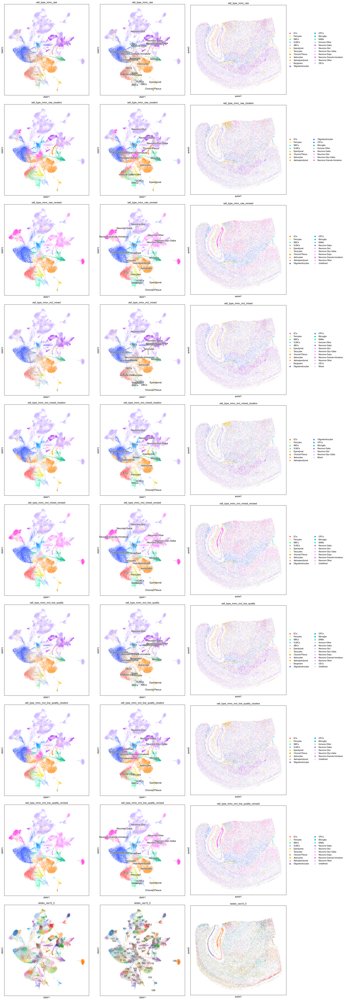

In [54]:
plot_keys = [
    "cell_type_mmc_raw",
    "cell_type_mmc_raw_clusters",
    "cell_type_mmc_raw_revised",
    "cell_type_mmc_incl_mixed",
    "cell_type_mmc_incl_mixed_clusters",
    "cell_type_mmc_incl_mixed_revised",
    "cell_type_mmc_incl_low_quality",
    "cell_type_mmc_incl_low_quality_clusters",
    "cell_type_mmc_incl_low_quality_revised",
    leiden_col,
]

# ensure consistent category order
for key in plot_keys:
    if key != leiden_col:
        adata.obs[key] = pd.Categorical(
            adata.obs[key], categories=list(cell_type_colors.keys())
        ).remove_unused_categories()

fig, axes = plt.subplots(
    len(plot_keys),
    3,
    figsize=(26, 9 * len(plot_keys)),
    gridspec_kw={"wspace": 0, "hspace": 0.1},
)

for i, key in enumerate(plot_keys):
    palette = long_palette if key == leiden_col else cell_type_colors

    sc.pl.umap(
        adata,
        color=key,
        size=pt_size_umap,
        legend_fontoutline=2,
        legend_fontweight="normal",
        legend_fontsize=7,
        legend_loc=None,
        palette=palette,
        ax=axes[i, 0],
        show=False,
    )
    axes[i, 0].set_aspect("equal")

    sc.pl.umap(
        adata,
        color=key,
        legend_loc="on data",
        palette=palette,
        size=pt_size_umap,
        legend_fontweight="normal",
        legend_fontsize=12,
        legend_fontoutline=1.5,
        ax=axes[i, 1],
        show=False,
    )
    axes[i, 1].set_aspect("equal")

    # Spatial
    sc.pl.embedding(
        adata,
        basis="spatial",
        color=key,
        size=150000 / adata.shape[0],
        palette=palette,
        legend_loc=None if key == leiden_col else "right margin",
        ax=axes[i, 2],
        show=False,
    )
    axes[i, 2].set_aspect("equal")

output_path = os.path.join(annotation_path, "UMAP_and_SPATIAL_mapmycells_results.png")
plt.savefig(output_path, dpi=200, bbox_inches="tight")
plt.show()

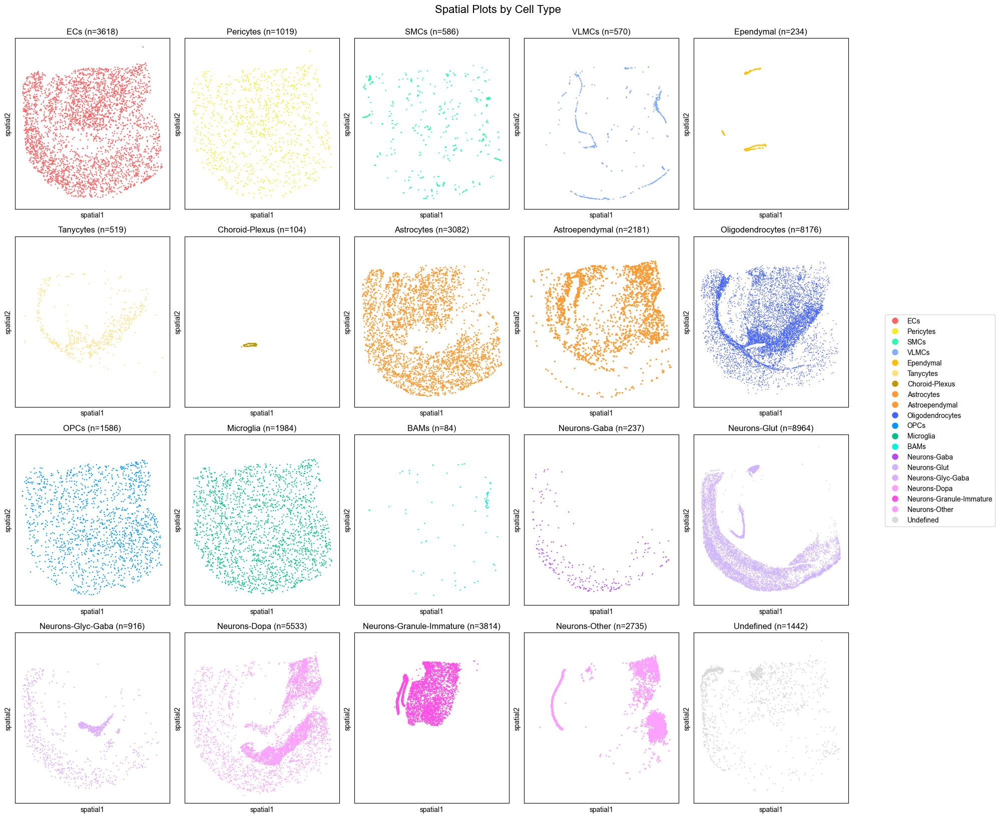

In [55]:
import math
import os

import matplotlib.pyplot as plt
import scanpy as sc

ct_col = "cell_type_mmc_raw_revised"
spatial = adata.obsm["spatial"]
cell_types = adata.obs[ct_col].cat.categories
n_types = len(cell_types)
n_cols = math.ceil(math.sqrt(n_types))
n_rows = math.ceil(n_types / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axs = axs.flatten() if n_types > 1 else [axs]

# Spatial limits with margin
x, y = spatial[:, 0], spatial[:, 1]
margin_x, margin_y = 0.05 * (x.max() - x.min()), 0.05 * (y.max() - y.min())
xlim, ylim = (
    (x.min() - margin_x, x.max() + margin_x),
    (y.min() - margin_y, y.max() + margin_y),
)

handles, labels = [], []
for i, ct in enumerate(cell_types):
    if i >= len(axs):
        break
    mask = adata.obs[ct_col] == ct
    if not mask.any():
        continue

    count = mask.sum()
    sc.pl.embedding(
        adata[mask],
        basis="spatial",
        color=ct_col,
        size=12 if count < 2000 else 50000 / count,
        legend_loc=None,
        palette={ct: cell_type_colors.get(ct, "gray")},
        show=False,
        ax=axs[i],
        title=f"{ct} (n={count})",
    )
    axs[i].set_xlim(xlim)
    axs[i].set_ylim(ylim)
    handles.append(
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            markerfacecolor=cell_type_colors.get(ct, "gray"),
            markersize=10,
        )
    )
    labels.append(ct)

# Remove unused axes
for ax in axs[len(cell_types) :]:
    fig.delaxes(ax)

fig.legend(handles, labels, loc="center right", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.suptitle("Spatial Plots by Cell Type", fontsize=16, y=1.02)
plt.savefig(
    os.path.join(annotation_path, f"SPATIAL_subplots_{ct_col}.png"),
    dpi=200,
    bbox_inches="tight",
)
plt.show()

In [63]:
# export data
normalized_percentage.to_csv(
    os.path.join(annotation_path, "mapmycells_leiden_crosstab_normalized.csv")
)

In [64]:
# subset columns
adata.obs = adata.obs[
    [
        col
        for col in adata.obs.columns
        if any(substr in col for substr in ["cell_id", "leiden", "score", "mmc"])
    ]
]

# replace nan with "None" for downstream compatibility
na_cols = [
    "cell_type_mmc_runner_up_1",
    "cell_type_mmc_runner_up_2",
    "cell_type_mmc_runner_up_1_incl_low_quality",
    "cell_type_mmc_runner_up_2_incl_low_quality",
]
for col in na_cols:
    if pd.api.types.is_categorical_dtype(adata.obs[col]):
        adata.obs[col] = adata.obs[col].cat.add_categories("None")
    adata.obs[col] = adata.obs[col].fillna("None")

In [65]:
adata.obs.to_csv(os.path.join(annotation_path, "adata_obs_annotated.csv"), index=False)